In [1]:
import os
import re
import time
import json
import numpy as np
import pandas as pd
import pysubgroup as ps
import pyarrow.parquet as pq
from IPython.display import display
from scipy.stats import gaussian_kde
from matplotlib import gridspec
from matplotlib.ticker import FuncFormatter
from matplotlib.patches import Rectangle
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.transforms as transforms
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline, make_pipeline 
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_validate
from sklearn.metrics import make_scorer, mean_absolute_error, mean_squared_error, r2_score

import utils 

import warnings
warnings.filterwarnings("ignore")

plt.rcParams.update({
    'font.weight': 'bold',      # 全局字体粗细
    'axes.labelweight': 'bold', # 轴标签粗细
    'axes.titleweight': 'bold', # 标题粗细
    'axes.titlesize': 20,       # 标题字体大小
    'axes.labelsize': 20,       # 轴标签字体大小
    'axes.linewidth': 2,        # 坐标轴线宽
    'xtick.labelsize': 14,      # x轴刻度字体大小
    'ytick.labelsize': 14,      # y轴刻度字体大小
    'legend.fontsize': 14,      # 图例字体大小
    'xtick.major.width': 2,
    'ytick.major.width': 2
})

# Views datasets

high entropy alloys
high entropy alloys (162, 9) ---> target: $ΔH_{SSS}$ 

KNN-based ceramics
KNN-based ceramics (1113, 8) ---> target: $d_{33}$ 



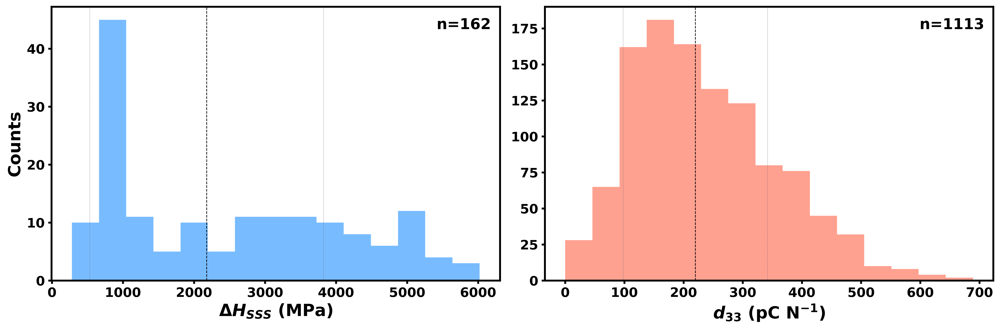

In [2]:
utils.view_dataset()

# Get rule extraction

In [3]:
# import datasets and extract rules
ds = utils.read_jsonzip(os.path.join("data", "datasets.json.gz"))
rules = utils.get_rule_extraction(ds, depth=3, weight_factor=1.0, bins=5, result_size=5)

# use this to view the information of each rule
utils.view_all_rules(rules)

utils.write_jsonzip(rules, os.path.join("data", "rules.json.gz"))

Extracting rules 1: high entropy alloys
Extracting rules 2: KNN-based ceramics
high entropy alloys


,quality,subgroup,size_sg,size_dataset,mean_sg,mean_dataset,std_sg,std_dataset,median_sg,median_dataset,max_sg,max_dataset,min_sg,min_dataset,mean_lift,median_lift
0,110850.111111,ξ==4,90,162,3712.933333,2481.265432,1140.813002,1639.639887,3648.5,2179.5,6020,6020,1136,281,1.496387,1.674008
1,64803.771605,δG: [0.36:0.51[ AND ξ==4,31,162,4571.709677,2481.265432,877.582978,1639.639887,4988.0,2179.5,6020,6020,2692,281,1.842491,2.288598
2,64585.506173,δG: [0.36:0.51[,32,162,4499.562500,2481.265432,952.599763,1639.639887,4980.5,2179.5,6020,6020,2263,281,1.813414,2.285157
3,64357.506173,ΔG: [0.06:0.19[ AND ξ==4,32,162,4492.437500,2481.265432,950.933158,1639.639887,4667.5,2179.5,6020,6020,2043,281,1.810543,2.141546
4,64357.506173,ΔG: [0.06:0.19[,32,162,4492.437500,2481.265432,950.933158,1639.639887,4667.5,2179.5,6020,6020,2043,281,1.810543,2.141546


KNN-based ceramics


,quality,subgroup,size_sg,size_dataset,mean_sg,mean_dataset,std_sg,std_dataset,median_sg,median_dataset,max_sg,max_dataset,min_sg,min_dataset,mean_lift,median_lift
0,21319.592093,NMB: [5.78:5.86[,223,1113,331.623318,236.019766,133.882827,121.987167,341.0,220.0,610.0,689.0,0.0,0.0,1.405066,1.550000
1,15940.392183,IDA>=0.07,309,1113,287.606796,236.019766,144.868096,121.987167,280.0,220.0,670.0,689.0,0.0,0.0,1.218571,1.272727
2,15364.111860,VEN/NC-B: [0.12:0.12[,222,1113,305.227477,236.019766,150.517752,121.987167,317.5,220.0,670.0,689.0,0.0,0.0,1.293228,1.443182
3,14933.884996,NMB: [5.78:5.86[ AND VEN/NC-B: [0.12:0.12[,107,1113,375.588785,236.019766,120.845383,121.987167,390.0,220.0,610.0,689.0,0.0,0.0,1.591345,1.772727
4,13582.651393,MVB: [11.18:11.27[,220,1113,297.759091,236.019766,118.521847,121.987167,277.5,220.0,610.0,689.0,0.0,0.0,1.261585,1.261364


# Visualize rule extraction

In [2]:
utils.view_rule_extraction()

1: high entropy alloys
rule:  ξ==4
2: KNN-based ceramics
rule:  NMB: [5.78:5.86[


# Get rule validation

In [2]:
# regression models
models = {
    "LR": LinearRegression(),
    "DT": DecisionTreeRegressor(random_state=0),
    "RF": RandomForestRegressor(random_state=12),
    "SVR(linear)": SVR(kernel='linear'),
    "SVR(rbf)": SVR(kernel='rbf'),
    "KNN": KNeighborsRegressor(),
    "XGBoost": XGBRegressor(seed=0),
    "MLP": MLPRegressor(hidden_layer_sizes=(100, ), activation='relu', solver='adam', max_iter=1000, random_state=42)
}

starttime = time.time()

splits = utils.rule_validation(models)

print(f"\nRule validation runtime: {round((time.time() - starttime)/60, 2)} min")

# save features to file
utils.write_jsonzip(splits, os.path.join("data", "splits.json.gz"))

1: high entropy alloys
rule:  ξ==4
90
LR : 	{'overall': {'mape': 31.4532, 'rmse': 578.2857},
 'split': {'random': {'cross_group': {'Group1 Train, Group2 Test': {'mape': 33.1016,
                                                                    'rmse': 595.926},
                                      'Group2 Train, Group1 Test': {'mape': 33.1066,
                                                                    'rmse': 610.4242}},
                      'within_group': {'Group False': {'mape': 33.027,
                                                       'rmse': 595.1925},
                                       'Group True': {'mape': 32.5959,
                                                      'rmse': 592.8384}}},
           'rule': {'cross_group': {'Group1 Train, Group2 Test': {'mape': 276.3506,
                                                                  'rmse': 2260.6615},
                                    'Group2 Train, Group1 Test': {'mape': 83.7273,
                   

# Visualize MAPE rule validation

In [2]:
utils.view_rule_validation("mape")

1: high entropy alloys
LR           - Rule SDSS:  12.84%,		 Random SDSS:  99.12%
DT           - Rule SDSS:  12.60%,		 Random SDSS:  98.98%
RF           - Rule SDSS:  11.33%,		 Random SDSS:  98.37%
SVR(linear)  - Rule SDSS:  13.74%,		 Random SDSS: 104.53%
SVR(rbf)     - Rule SDSS:  13.94%,		 Random SDSS: 102.67%
KNN          - Rule SDSS:  11.12%,		 Random SDSS:  98.56%
XGBoost      - Rule SDSS:  10.22%,		 Random SDSS: 100.38%
MLP          - Rule SDSS:  15.09%,		 Random SDSS: 100.92%
Average      - Rule SDSS: 12.61% ± 1.53%,	 Random SDSS: 100.44% ± 2.05%
2: KNN-based ceramics
LR           - Rule SDSS:  66.43%,		 Random SDSS:  96.63%
DT           - Rule SDSS:  74.39%,		 Random SDSS: 105.43%
RF           - Rule SDSS:  72.42%,		 Random SDSS:  99.96%
SVR(linear)  - Rule SDSS:  73.68%,		 Random SDSS: 100.19%
SVR(rbf)     - Rule SDSS:  70.70%,		 Random SDSS: 100.63%
KNN          - Rule SDSS:  58.47%,		 Random SDSS: 100.22%
XGBoost      - Rule SDSS:  65.35%,		 Random SDSS:  99.70%
MLP          

# View RMSE rule validation

In [3]:
utils.view_rule_validation("rmse")

1: high entropy alloys
LR           - Rule SDSS:  16.92%,		 Random SDSS:  98.48%
DT           - Rule SDSS:  21.97%,		 Random SDSS:  96.68%
RF           - Rule SDSS:  18.20%,		 Random SDSS:  93.31%
SVR(linear)  - Rule SDSS:  25.27%,		 Random SDSS: 101.56%
SVR(rbf)     - Rule SDSS:  25.85%,		 Random SDSS: 100.84%
KNN          - Rule SDSS:  18.14%,		 Random SDSS:  94.82%
XGBoost      - Rule SDSS:  17.60%,		 Random SDSS:  95.60%
MLP          - Rule SDSS:  33.65%,		 Random SDSS:  96.73%
Average      - Rule SDSS: 22.20% ± 5.43%,	 Random SDSS: 97.25% ± 2.69%
2: KNN-based ceramics
LR           - Rule SDSS:  36.26%,		 Random SDSS:  65.82%
DT           - Rule SDSS:  78.17%,		 Random SDSS:  99.67%
RF           - Rule SDSS:  74.20%,		 Random SDSS: 100.07%
SVR(linear)  - Rule SDSS:  69.01%,		 Random SDSS:  99.13%
SVR(rbf)     - Rule SDSS:  68.66%,		 Random SDSS:  99.97%
KNN          - Rule SDSS:  58.82%,		 Random SDSS:  97.65%
XGBoost      - Rule SDSS:  76.93%,		 Random SDSS:  99.54%
MLP          -

# Low SDSS integrating way: data subset splitting with descriptors constructed by feature engineering

In [8]:
# read datasets
ds = utils.read_jsonzip(os.path.join("data", "datasets.json.gz"))
rules = utils.read_jsonzip(os.path.join("data", "rules.json.gz"))

# first dataset
dsn = list(ds.keys())[0]
descriptors = {dsn: {}}
starttime = time.time()

print(f"1: {dsn}")
df = pd.DataFrame(json.loads(ds[dsn]["df"]))
t = ds[dsn]["target"]
target_vals = df[t].values

transformation_list = ["x^-2", "x^-1", "x", "sqrt(x)", "x^2", "e^x", "lnx"]

# create a nonlinear transformation model
model = utils.NonlinearTransAndDesc(3, nonlineartrans_list=transformation_list)

# splitting data based on rule
subset1 = df[df['ξ'] == 4]
subset2 = df[df['ξ'] != 4]
X1 = subset1.drop([t], axis=1)
X2 = subset2.drop([t], axis=1)
y1 = subset1[t]
y2 = subset2[t]
X_des1 = model.fit_transform(X1, y1)
X_des2 = model.fit_transform(X2, y2)

descriptors[dsn]['subset1_descriptors'] = X_des1.to_dict(orient='records')
descriptors[dsn]['subset2_descriptors'] = X_des2.to_dict(orient='records')

print("ξ = 4 subset: ")
display(X_des1)
print("ξ = 1 subset: ")
display(X_des2)

print(f"\nConstruct descriptors runtime: {round((time.time() - starttime)/60, 2)} min")
# save descriptors to file
utils.write_jsonzip(descriptors, os.path.join("data", "descriptors.json.gz"))

1: high entropy alloys
ξ = 4 subset: 


,G_rec2*δG_rec2*δXr_rec2,G_rec2*δG_rec2*δXr_rec,G_rec2*δG_rec2*δXr,G_rec2*δG_rec2*δXr_sqrt,G_rec2*δG_rec2*δXr_square,G_rec2*δG_rec2*δXr_exp,G_rec2*δG_rec2*δXr_ln,G_rec2*δG_rec*δXr_rec2,G_rec2*δG_rec*δXr_rec,G_rec2*δG_rec*δXr,...,ε_ln*δ_exp*Δ_exp,ε_ln*δ_exp*Δ_ln,ε_ln*δ_ln*Δ_rec2,ε_ln*δ_ln*Δ_rec,ε_ln*δ_ln*Δ,ε_ln*δ_ln*Δ_sqrt,ε_ln*δ_ln*Δ_square,ε_ln*δ_ln*Δ_exp,ε_ln*δ_ln*Δ_ln,$ΔH_{SSS}$
72,3.192881,0.112108,0.000138,0.000738,0.000005,0.004077,-0.013184,0.548585,0.019262,0.000024,...,-0.877212,3.695970,13065.351581,182.222459,0.035446,0.300139,0.000494,2.577151,-10.858350,2991
73,1.330615,0.054262,0.000090,0.000447,0.000004,0.002305,-0.007080,0.316274,0.012898,0.000021,...,-0.565826,1.533902,488.434911,27.716239,0.089246,0.374650,0.005064,1.664585,-4.512538,3783
74,0.777315,0.035198,0.000072,0.000339,0.000003,0.001668,-0.004933,0.226115,0.010239,0.000021,...,-0.332696,0.768325,130.979819,10.689656,0.071200,0.249231,0.005811,0.946601,-2.186068,5252
75,0.350771,0.021180,0.000077,0.000314,0.000005,0.001359,-0.003590,0.127188,0.007680,0.000028,...,0.044357,-0.083552,-7.329494,-0.877077,-0.012559,-0.036306,-0.001503,-0.118296,0.222825,4475
76,0.358263,0.021534,0.000078,0.000317,0.000005,0.001375,-0.003639,0.128689,0.007735,0.000028,...,0.031495,-0.059652,-5.337379,-0.632762,-0.008893,-0.025829,-0.001054,-0.084458,0.159963,4561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157,0.157087,0.012079,0.000071,0.000258,0.000005,0.001003,-0.002383,0.057965,0.004457,0.000026,...,-0.941882,1.872626,232.582192,25.336574,0.300670,0.910972,0.032754,3.077724,-6.119050,5072
158,0.150320,0.009885,0.000043,0.000167,0.000003,0.000694,-0.001769,0.100393,0.006602,0.000029,...,-1.324392,4.390524,4298.112380,139.925049,0.148296,0.821906,0.004828,4.705997,-15.600965,3997
159,5.680251,0.218400,0.000323,0.001647,0.000012,0.008726,-0.027362,1.342067,0.051601,0.000076,...,-0.558876,1.468627,462.812470,28.322735,0.106071,0.428776,0.006491,1.842650,-4.842152,1869
160,2.891575,0.207381,0.001067,0.003983,0.000077,0.015979,-0.039191,0.607951,0.043602,0.000224,...,-0.921758,2.211979,498.919157,37.532690,0.212407,0.774424,0.015979,3.044110,-7.305073,2603


ξ = 1 subset: 


,G_rec2*δG_rec2*δXr_rec2,G_rec2*δG_rec2*δXr_rec,G_rec2*δG_rec2*δXr,G_rec2*δG_rec2*δXr_sqrt,G_rec2*δG_rec2*δXr_square,G_rec2*δG_rec2*δXr_exp,G_rec2*δG_rec2*δXr_ln,G_rec2*δG_rec*δXr_rec2,G_rec2*δG_rec*δXr_rec,G_rec2*δG_rec*δXr,...,ε_ln*δ_exp*Δ_exp,ε_ln*δ_exp*Δ_ln,ε_ln*δ_ln*Δ_rec2,ε_ln*δ_ln*Δ_rec,ε_ln*δ_ln*Δ,ε_ln*δ_ln*Δ_sqrt,ε_ln*δ_ln*Δ_square,ε_ln*δ_ln*Δ_exp,ε_ln*δ_ln*Δ_ln,$ΔH_{SSS}$
0,0.772365,0.036961,0.000085,0.000387,0.000004,0.001855,-0.005376,0.229062,0.010962,0.000025,...,-0.967691,3.970858,22341.664120,346.094719,0.083053,0.667289,0.001287,5.445053,-22.343419,734
1,0.852671,0.039838,0.000087,0.000402,0.000004,0.001950,-0.005702,0.246233,0.011504,0.000025,...,-0.989295,4.030714,19616.877130,312.438002,0.079256,0.628007,0.001262,5.056091,-20.600172,745
2,0.946593,0.043118,0.000089,0.000419,0.000004,0.002056,-0.006067,0.265801,0.012108,0.000025,...,-1.018923,4.128908,16495.348005,268.313331,0.070991,0.556626,0.001155,4.435956,-17.975496,765
3,1.057413,0.046887,0.000092,0.000438,0.000004,0.002173,-0.006478,0.288269,0.012782,0.000025,...,-1.054454,4.256400,14615.394355,241.300161,0.065774,0.511892,0.001086,4.050185,-16.348944,825
4,1.696660,0.067027,0.000105,0.000526,0.000004,0.002755,-0.008556,0.408154,0.016124,0.000025,...,-1.220967,4.921726,13573.153081,225.287195,0.062065,0.481748,0.001030,3.801900,-15.325489,923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,0.577240,0.033943,0.000117,0.000484,0.000007,0.002117,-0.005656,0.155026,0.009116,0.000032,...,-0.356300,0.774904,129.703083,11.947599,0.101377,0.334023,0.009338,1.206747,-2.624508,1158
68,1.595216,0.076771,0.000178,0.000811,0.000009,0.003877,-0.011209,0.309290,0.014885,0.000034,...,-1.113897,3.811469,4231.223203,124.727998,0.108383,0.631264,0.003195,3.786728,-12.957212,771
69,4.975811,0.176273,0.000221,0.001175,0.000008,0.006470,-0.020859,0.858089,0.030399,0.000038,...,-2.307184,8.844477,18829.171477,376.978842,0.151108,1.067937,0.003025,7.700125,-29.518047,1464
70,0.692005,0.038844,0.000122,0.000517,0.000007,0.002306,-0.006280,0.182117,0.010223,0.000032,...,-0.466916,1.076052,364.230817,29.854543,0.200576,0.700585,0.016440,2.656082,-6.121194,955



Construct descriptors runtime: 2.96 min


# Plot constructed descriptors prediction performance

'ξ = 4' subset top 15 descriptors: 


,Eq,w,b,r,R2,RMSE,MAE,MAPE
0,G_ln*δXr_exp*Δ_exp,970.09,3712.93,0.850351,0.72,600.31,490.21,14.83
1,G*δXr_sqrt*Δ_sqrt,940.70,3712.93,0.824591,0.68,645.39,521.77,16.81
2,G*δXr_exp*Δ_sqrt,938.59,3712.93,0.822742,0.68,648.46,524.38,16.35
3,G_ln*δ_exp*Δ_exp,938.04,3712.93,0.822255,0.68,649.26,534.56,16.48
4,G_rec*δXr_ln*Δ_ln,-936.31,3712.93,0.820742,0.67,651.75,513.68,15.22
5,G*δXr_sqrt*ε_sqrt,935.30,3712.93,0.819854,0.67,653.20,531.72,17.11
6,G*δ_exp*Δ_sqrt,933.70,3712.93,0.818449,0.67,655.49,527.27,16.50
7,G_rec2*δXr_rec*Δ_ln,933.46,3712.93,0.818242,0.67,655.82,543.59,16.75
8,G_square*δXr*ε_sqrt,932.08,3712.93,0.817034,0.67,657.78,549.42,17.87
9,G_square*δXr_exp*Δ,929.95,3712.93,0.815166,0.66,660.79,537.96,17.04



'ξ = 1' subset top 15 descriptors: 


,Eq,w,b,r,R2,RMSE,MAE,MAPE
0,δG_square*ΔG_square*ε_square,296.47,941.68,0.751700,0.57,260.10,162.17,22.95
1,δG_square*δXr_square*ΔG_square,294.83,941.68,0.747561,0.56,261.95,170.81,23.24
2,δG_square*ΔG_square*ε,291.47,941.68,0.739026,0.55,265.69,171.34,23.57
3,δG_square*ΔG_square*Δ,290.94,941.68,0.737688,0.54,266.27,169.38,23.56
4,δG_square*ΔG_square*Δ_sqrt,289.87,941.68,0.734978,0.54,267.43,175.41,23.88
5,δG_square*ΔG*ε_square,289.69,941.68,0.734529,0.54,267.63,169.03,24.11
6,δG*ΔG_square*ε_square,288.25,941.68,0.730871,0.53,269.18,170.53,23.83
7,δG*δXr_square*ΔG_square,288.07,941.68,0.730401,0.53,269.38,177.79,24.10
8,δXr_square*ΔG_square*ε_square,287.68,941.68,0.729423,0.53,269.79,173.25,24.03
9,δG_square*δXr_square*ΔG,287.52,941.68,0.729020,0.53,269.96,183.69,24.86


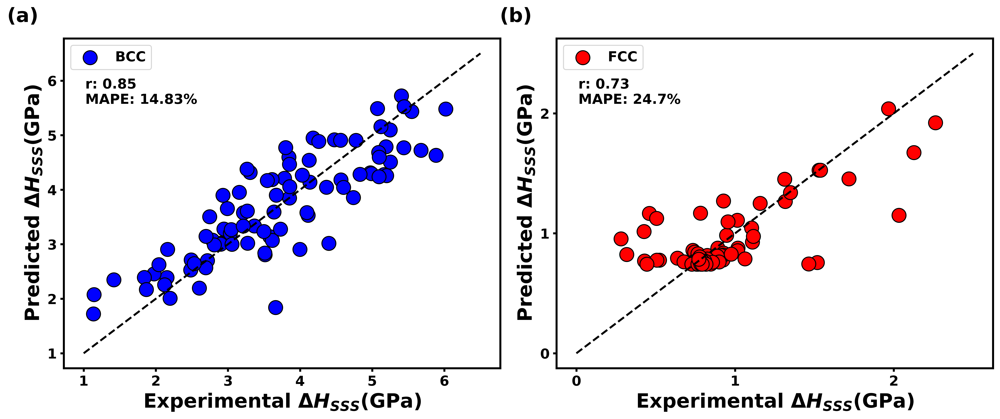

In [9]:
def calculate_metrics(y_true, y_pred):
    R2 = round(r2_score(y_true, y_pred), 2)
    RMSE = round(utils.rmse(y_true, y_pred), 2)
    MAE = round(mean_absolute_error(y_true, y_pred), 2)
    MAPE = round(utils.mape(y_true, y_pred), 2)
    return R2, RMSE, MAE, MAPE
    
ds = utils.read_jsonzip(os.path.join("data", "datasets.json.gz"))
descriptors = utils.read_jsonzip(os.path.join("data", "descriptors.json.gz"))

dsn = list(ds.keys())[0]
t = ds[dsn]["target"]

Subset1_des = pd.DataFrame(descriptors[dsn]['subset1_descriptors'])
Subset2_des = pd.DataFrame(descriptors[dsn]['subset2_descriptors'])

X1 = Subset1_des.drop([t], axis=1)
y1 = Subset1_des[t]

X2 = Subset2_des.drop([t], axis=1)
y2 = Subset2_des[t]

print("'ξ = 4' subset top 15 descriptors: ")
w1, b1, r1, y1_true, y1_pred = utils.regression_prediction(X1, y1)
print("\n'ξ = 1' subset top 15 descriptors: ")
w2, b2, r2, y2_true, y2_pred = utils.regression_prediction(X2, y2, "δG_square*δXr_square*ε_square")

# calculate their respective indicators
R2_1, RMSE_1, MAE_1, MAPE_1 = calculate_metrics(y1_true, y1_pred)
R2_2, RMSE_2, MAE_2, MAPE_2 = calculate_metrics(y2_true, y2_pred)

# merge data and calculate metrics
y_true_combined = np.concatenate([y1_true.values.flatten(), y2_true.values.flatten()])
y_pred_combined = np.concatenate([y1_pred.values.flatten(), y2_pred.values.flatten()])
r = round(np.corrcoef(y_true_combined, y_pred_combined)[0, 1], 2)
R2, RMSE, MAE, MAPE = calculate_metrics(y_true_combined, y_pred_combined)

# scatter plot
# fig, axs = plt.subplots(1, 2, figsize=(14, 6))
# subsets = [
#     (y2_true, y2_pred, '"ξ = 1"', '#40A429', (0, 2500), r2, MAPE_2, -0.13, 0.16, '(a)'),
#     (y1_true, y1_pred, '"ξ = 4"', '#3C519C', (1000, 6500), r1, MAPE_1, -0.14, 0.72, '(b)')
# ]
# for i, (y_true, y_pred, label, color, line_range, r_value, mape_value, text_x, fig_text_x, subplot_label) in enumerate(subsets):
#     axs[i].scatter(y_true, y_pred, color=color, marker='o', alpha=0.5, s=120, label=label, edgecolor='black')
#     axs[i].plot(line_range, line_range, color='black', linestyle='--', lw=2)
#     axs[i].legend()
#     axs[i].set_xlabel(f'Experimental {t} ({ds[dsn]["units"]})')
#     if i == 0:
#         axs[i].set_ylabel(f'Predicted {t} ({ds[dsn]["units"]})')
#     axs[i].text(text_x, 1.05, subplot_label, transform=axs[i].transAxes, fontsize=20)
#     fig.text(fig_text_x, 0.16, f'r: {r_value:.2f}\nMAPE: {mape_value:.2f}%', transform=plt.gca().transAxes, fontsize=14, verticalalignment='top', color='black')

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
axs[0].scatter(y1_true, y1_pred, color='#0000FF', marker='o', s=200, edgecolor='black', label='BCC')
axs[0].plot([1000, 6500], [1000, 6500], color='black', linestyle='--', lw=2)
axs[0].legend()
axs[0].set_xlabel(f'Experimental {t}(GPa)')
axs[0].set_ylabel(f'Predicted {t}(GPa)')
axs[0].text(-0.13, 1.05, '(a)', transform=axs[0].transAxes, fontsize=20)
x_ticks = np.arange(1000, 6501, 1000)
x_tick_labels = [str(int(tick / 1000)) for tick in x_ticks]
axs[0].set_xticks(x_ticks)
axs[0].set_xticklabels(x_tick_labels)
y_ticks = np.arange(1000, 6501, 1000)
y_tick_labels = [str(int(tick / 1000)) for tick in y_ticks]
axs[0].set_yticks(y_ticks)
axs[0].set_yticklabels(y_tick_labels)
fig.text(-1.08, 0.88, f'r: {r1:.2f}\nMAPE: {MAPE_1}%', transform=plt.gca().transAxes, fontsize=14, verticalalignment='top', color='black')

axs[1].scatter(y2_true, y2_pred, color='#FF0000', marker='o', s=200, edgecolor='black', label='FCC')
axs[1].plot([0, 2500], [0, 2500], color='black', linestyle='--', lw=2)
axs[1].legend()
axs[1].set_xlabel(f'Experimental {t}(GPa)')
axs[1].set_ylabel(f'Predicted {t}(GPa)')
axs[1].text(-0.13, 1.05, '(b)', transform=axs[1].transAxes, fontsize=20)
x_ticks = np.arange(0, 2501, 1000)
x_tick_labels = [str(int(tick / 1000)) for tick in x_ticks]
axs[1].set_xticks(x_ticks)
axs[1].set_xticklabels(x_tick_labels)
y_ticks = np.arange(0, 2501, 1000)
y_tick_labels = [str(int(tick / 1000)) for tick in y_ticks]
axs[1].set_yticks(y_ticks)
axs[1].set_yticklabels(y_tick_labels)
fig.text(0.05, 0.88, f'r: {r2:.2f}\nMAPE: {MAPE_2}%', transform=plt.gca().transAxes, fontsize=14, verticalalignment='top', color='black')

plt.tight_layout()
plt.savefig(os.path.join(utils.FIG_BASEPATH, "FormulaPerformance.png"))
plt.show()

# High SDSS integrating way: rule embedding

In [4]:
# read datasets and rules
ds = utils.read_jsonzip(os.path.join("data", "datasets.json.gz"))
rules = utils.read_jsonzip(os.path.join("data", "rules.json.gz"))
starttime = time.time()

# get second dataset
dsn = list(ds.keys())[1]
df = pd.DataFrame(json.loads(ds[dsn]["df"]))
t = ds[dsn]["target"]

# get top rule
rule = json.loads(rules[dsn]['rules'])['subgroup']['0']
print(f"rule: {rule}\n")
# check if there are comparison operators in the rules
operators = ['<', '>', '<=', '>=', '==']
if not any(op in rule for op in operators):
    rule = utils.convert_to_rule(rule)
# parse rule
value1, operator1, rule_feature, operator2, value2 = utils.parse_rule(rule)

# prepare feature data
X_baseline = df.drop([t], axis=1)
y = df[t]
X_rect = X_baseline.copy()
X_rect['rule_rect'] = df[rule_feature].apply(utils.rectangular_membership, args=(5.7847418, 5.8648785))
X_bell = X_baseline.copy()
X_bell['rule_bell'] = df[rule_feature].apply(utils.bell_membership, args=(0.095, 1.0, 5.82481015))

# model list
models = {
    'LR': LinearRegression(),
    'DT': DecisionTreeRegressor(random_state=0),
    'RF': RandomForestRegressor(random_state=1),
    'SVR(linear)': SVR(kernel='linear'),
    'SVR(rbf)': SVR(kernel='rbf'),
    'KNN': KNeighborsRegressor(),
    'XGBoost': XGBRegressor(seed=10),
    'MLP': MLPRegressor(hidden_layer_sizes=(100, ), activation='relu', solver='adam', max_iter=1000, random_state=42),
}

# k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 定义评估指标
scoring={
        'r2': 'r2',
        'rmse': make_scorer(utils.rmse, greater_is_better=False),
        'mae': 'neg_mean_absolute_error',
        'mape': make_scorer(utils.mape, greater_is_better=False)
}

membership_type = ["baseline", "rect", "bell"]
X_membership = {
    "baseline": X_baseline,
    "rect": X_rect,
    "bell": X_bell
}

memberships = {dsn: {}}

for name, model in models.items():
    pipeline = make_pipeline(StandardScaler(), model)

    print(f"{name}:")
    membership_results = {}
    for membership in membership_type:
        X = X_membership[membership]
        cv_results = cross_validate(pipeline, X, y, cv=kf, scoring=scoring)

        metrics = {}
        for metric in ['r2', 'rmse', 'mae', 'mape']:
            result = np.mean(cv_results[f'test_{metric}'])
            if metric == 'rmse' or metric =='mae' or metric =='mape':
                result = -result 
            metrics[metric] = result
            
        membership_results[membership] = metrics
        
    memberships[dsn][name] = membership_results
    
    print(f"Baseline - Average R^2: {membership_results['baseline']['r2']:.2f}, Average RMSE: {membership_results['baseline']['rmse']:.2f}, Average MAE: {membership_results['baseline']['mae']:.2f}, Average MAPE: {membership_results['baseline']['mape']:.2f}")
    print(f"Rect - Average R^2: {membership_results['rect']['r2']:.2f}, Average RMSE: {membership_results['rect']['rmse']:.2f}, Average MAE: {membership_results['rect']['mae']:.2f}, Average MAPE: {membership_results['rect']['mape']:.2f}")
    print(f"Bell - Average R^2: {membership_results['bell']['r2']:.2f}, Average RMSE: {membership_results['bell']['rmse']:.2f}, Average MAE: {membership_results['bell']['mae']:.2f}, Average MAPE: {membership_results['bell']['mape']:.2f}")
    print()

print(f"\nRule embedding training and evaluation runtime: {round((time.time() - starttime)/60, 2)} min")
# save memberships to file
utils.write_jsonzip(memberships, os.path.join("data", "memberships.json.gz"))

rule: NMB: [5.78:5.86[

LR:
Baseline - Average R^2: 0.08, Average RMSE: 116.35, Average MAE: 91.31, Average MAPE: 83.91
Rect - Average R^2: 0.19, Average RMSE: 109.41, Average MAE: 85.20, Average MAPE: 79.43
Bell - Average R^2: 0.29, Average RMSE: 102.03, Average MAE: 77.09, Average MAPE: 72.02

DT:
Baseline - Average R^2: 0.28, Average RMSE: 102.50, Average MAE: 67.12, Average MAPE: 56.78
Rect - Average R^2: 0.32, Average RMSE: 100.23, Average MAE: 66.98, Average MAPE: 56.40
Bell - Average R^2: 0.32, Average RMSE: 99.50, Average MAE: 65.58, Average MAPE: 48.06

RF:
Baseline - Average R^2: 0.61, Average RMSE: 75.48, Average MAE: 51.34, Average MAPE: 52.95
Rect - Average R^2: 0.62, Average RMSE: 75.01, Average MAE: 51.12, Average MAPE: 52.60
Bell - Average R^2: 0.62, Average RMSE: 75.15, Average MAE: 51.35, Average MAPE: 49.96

SVR(linear):
Baseline - Average R^2: 0.02, Average RMSE: 120.07, Average MAE: 89.89, Average MAPE: 81.10
Rect - Average R^2: 0.14, Average RMSE: 112.64, Average 

# Plot rule embedding model performance across all ML methods

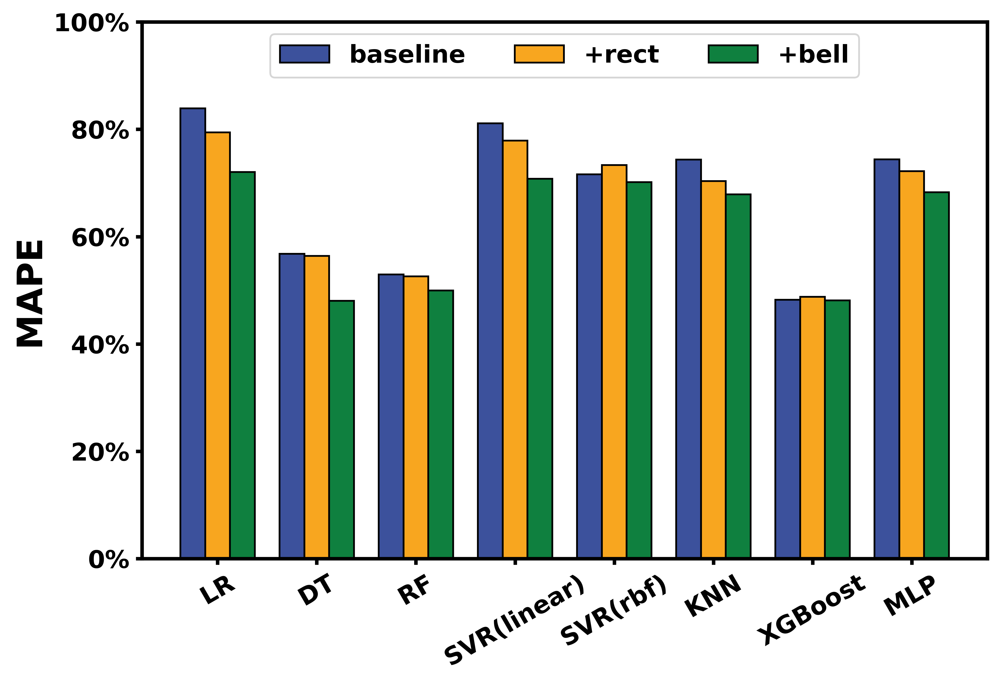

In [7]:
mape_baseline = []
mape_rect = []
mape_bell = []

def plot_mape_comparison():
    fig, ax = plt.subplots(figsize=(8, 5.5))
    width = 0.25
    x = np.arange(len(models)) 

    memberships = utils.read_jsonzip(os.path.join("data", "memberships.json.gz"))

    for dsn, model_dict in memberships.items():
        for model_name, membership_dict in model_dict.items():
            mape_baseline.append(membership_dict["baseline"]["mape"])
            mape_rect.append(membership_dict["rect"]["mape"])
            mape_bell.append(membership_dict["bell"]["mape"])
            
    rects1 = ax.bar(x - width, mape_baseline, width, label='baseline', color='#3C519C', edgecolor='black')
    rects2 = ax.bar(x, mape_rect, width, label='+rect', color='#F8A61F', edgecolor='black')
    rects3 = ax.bar(x + width, mape_bell, width, label='+bell', color='#0F803F', edgecolor='black')
    ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f'{y:.0f}%'))
    ax.set_ylim(0, 100)
    ax.set_ylabel('MAPE')
    ax.set_xticks(x)
    ax.set_xticklabels(models, rotation=30)
    ax.legend(loc='upper center', frameon=True, ncol=3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(utils.FIG_BASEPATH, "RuleEmbedding.png"))
    plt.show()
    
plot_mape_comparison()